In [1]:
import os
import mne
import pandas as pd

from datasets import load_dataset
from huggingface_hub import snapshot_download
from matplotlib import pyplot as plt

%matplotlib inline
%config InlineBackend.figure_format='retina'

import warnings
warnings.filterwarnings("ignore")

In [2]:
local_dir = snapshot_download(
    repo_id="zhuravlevahana/SIGNAL",
    repo_type="dataset",
    local_dir="../hf_old_datasets",
)

Fetching 64 files:   0%|          | 0/64 [00:00<?, ?it/s]

p11_epochs.fif:   0%|          | 0.00/182M [00:00<?, ?B/s]

p0_epochs.fif:   0%|          | 0.00/175M [00:00<?, ?B/s]

.gitattributes:   0%|          | 0.00/4.54k [00:00<?, ?B/s]

p10_epochs.fif:   0%|          | 0.00/181M [00:00<?, ?B/s]

p0_epochs.set:   0%|          | 0.00/176M [00:00<?, ?B/s]

p10_epochs.set:   0%|          | 0.00/182M [00:00<?, ?B/s]

p0_events.xlsx:   0%|          | 0.00/67.0k [00:00<?, ?B/s]

p10_events.xlsx:   0%|          | 0.00/63.6k [00:00<?, ?B/s]

p11_epochs.set:   0%|          | 0.00/182M [00:00<?, ?B/s]

p11_events.xlsx:   0%|          | 0.00/63.6k [00:00<?, ?B/s]

p12_epochs.fif:   0%|          | 0.00/179M [00:00<?, ?B/s]

p12_epochs.set:   0%|          | 0.00/179M [00:00<?, ?B/s]

Cancellation requested; stopping current tasks.


KeyboardInterrupt: 

In [ ]:
local_dir = snapshot_download(
    repo_id="ContributorsSIGNAL/SIGNAL",
    repo_type="dataset",
    local_dir="../hf_datasets",
)

In [5]:
eeg_foder = "../../hf_datasets/eeg"

Reading /Users/ilyamikheev/Desktop/cuscience/SIGNAL-analysis/notebooks/trash/../../hf_datasets/eeg/p0_epochs.fif ...
    Found the data of interest:
        t =    -400.00 ...     800.00 ms
        0 CTF compensation matrices available
Not setting metadata
579 matching events found
No baseline correction applied
0 projection items activated
Reading /Users/ilyamikheev/Desktop/cuscience/SIGNAL-analysis/notebooks/trash/../../hf_datasets/eeg/p10_epochs.fif ...
    Found the data of interest:
        t =    -400.00 ...     800.00 ms
        0 CTF compensation matrices available
Not setting metadata
598 matching events found
No baseline correction applied
0 projection items activated
Reading /Users/ilyamikheev/Desktop/cuscience/SIGNAL-analysis/notebooks/trash/../../hf_datasets/eeg/p11_epochs.fif ...
    Found the data of interest:
        t =    -400.00 ...     800.00 ms
        0 CTF compensation matrices available
Not setting metadata
600 matching events found
No baseline correction applie

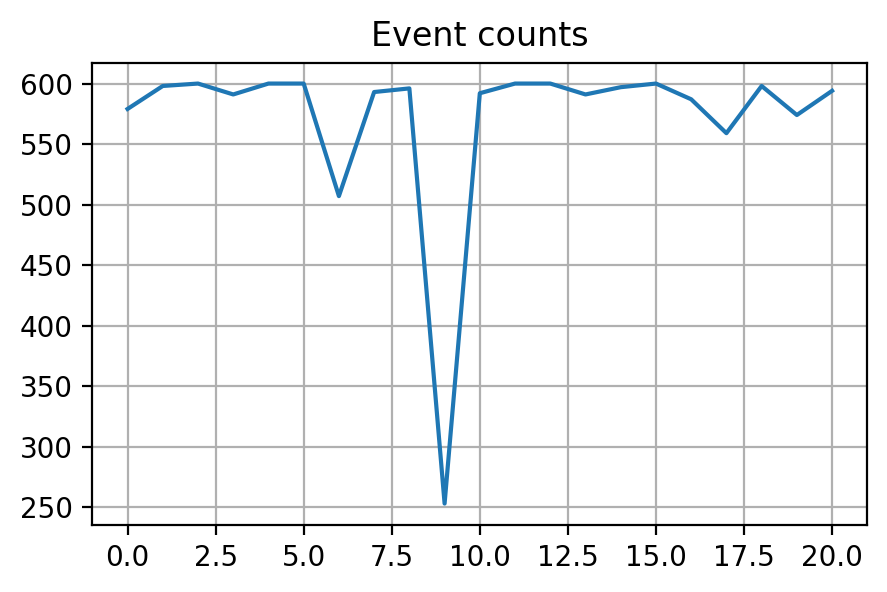

In [6]:
event_counts = []
for file in sorted(os.listdir(eeg_foder)):
    if file.endswith(".fif"):
        epochs = mne.read_epochs(os.path.join(eeg_foder, file), preload=True)
        event_counts.append(len(epochs))

plt.figure(figsize=[5, 3])
plt.plot(event_counts)
plt.grid()
plt.title("Event counts")
plt.show()

### Про

In [7]:
ds = load_dataset("ContributorsSIGNAL/SIGNAL", cache_dir="../hf_datasets")

stimuli.csv: 0.00B [00:00, ?B/s]

Generating train split:   0%|          | 0/600 [00:00<?, ? examples/s]

In [8]:
df = pd.read_csv("../hf_datasets/epochs_info/p0_events.csv")

FileNotFoundError: [Errno 2] No such file or directory: '../hf_datasets/epochs_info/p0_events.csv'

In [6]:
df

,sentence_id,sentence_id_eeg,sentence,structure,position,target,event_start,event_name
0,254,115,Следователи установили ремонт преступления,Subject - Verb - Object - Gen,2,semantics,20314,Stimulus/S 2_3
1,131,63,Неудачи преследовали экспедицией,Subject - Verb - Object,2,grammar,23814,Stimulus/S 3_1
2,68,34,Жильцы вызвали полицией,Subject - Verb - Object,2,grammar,26830,Stimulus/S 3_1
3,241,108,Самец демонстрирует брачный году,Subject - Verb - Adj - Object,3,semantics_grammar,29846,Stimulus/S 4_2
4,11,8,Барабанщик покинул группы,Subject - Verb - Object,2,grammar,33364,Stimulus/S 3_1
...,...,...,...,...,...,...,...,...
595,14,10,Бизнесмен отрицал вёслах,Subject - Verb - Object,2,semantics_grammar,2370202,Stimulus/S 4_1
596,231,104,Путешествие продлится центра,Subject - Verb - Object,2,semantics_grammar,2373219,Stimulus/S 4_1
597,141,68,Отец решал ране сыне,Subject - Verb - Object - Gen,2,semantics_grammar,2376235,Stimulus/S 4_3
598,260,118,Солдаты освобождали конференция,Subject - Verb - Object,2,semantics_grammar,2379752,Stimulus/S 4_1


In [7]:
df["event_name"]

0      Stimulus/S  2_3
1      Stimulus/S  3_1
2      Stimulus/S  3_1
3      Stimulus/S  4_2
4      Stimulus/S  3_1
            ...       
595    Stimulus/S  4_1
596    Stimulus/S  4_1
597    Stimulus/S  4_3
598    Stimulus/S  4_1
599    Stimulus/S  1_3
Name: event_name, Length: 600, dtype: object

In [8]:
stimuli_df = pd.read_csv("../hf_datasets/stimuli.csv")

In [9]:
stimuli_df

,sentence_id,sentence,congruent,structure,length,target,position,most_popular,percent,semantics_grammar,...,object_gender,object_ipm,gen_lemma,gen_length,gen_gender,gen_ipm,adj_lemma,adj_length,adj_gender,adj_ipm
0,0.0,Автобусы проходят массовую дезинфекцией,Автобусы проходят массовую дезинфекцию,Subject - Verb - Adj - Object,4.0,grammar,3.0,grammar,1.000000,NaN,...,femn,1.630000,NaN,NaN,NaN,0.02,массовый,4.0,masc,50.834561
1,0.0,Автобусы проходят массовую дезинфекцию,Автобусы проходят массовую дезинфекцию,Subject - Verb - Adj - Object,4.0,normal,3.0,normal,0.833333,NaN,...,femn,1.630000,NaN,NaN,NaN,0.02,массовый,4.0,masc,50.834561
2,0.0,Автобусы проходят массовую фортуной,Автобусы проходят массовую дезинфекцию,Subject - Verb - Adj - Object,4.0,semantics_grammar,3.0,semantics_grammar,1.000000,1.0,...,femn,1.630000,NaN,NaN,NaN,0.02,массовый,4.0,masc,50.834561
3,0.0,Автобусы проходят массовую фортуну,Автобусы проходят массовую дезинфекцию,Subject - Verb - Adj - Object,4.0,semantics,3.0,semantics,1.000000,NaN,...,femn,1.630000,NaN,NaN,NaN,0.02,массовый,4.0,masc,50.834561
4,2.0,Авторы получали подарками,Авторы получали подарки,Subject - Verb - Object,3.0,grammar,2.0,grammar,1.000000,NaN,...,masc,64.020000,NaN,NaN,NaN,0.02,NaN,NaN,NaN,0.020000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,334.0,Эксперты нашли следы пота,Эксперты нашли следы пота,Subject - Verb - Object - Gen,4.0,normal,2.0,normal,1.000000,NaN,...,masc,102.555755,пот,2.0,masc,33.17,NaN,NaN,NaN,0.020000
596,336.0,Эксперты сделали Париж,Эксперты сделали вывод,Subject - Verb - Object,3.0,semantics,2.0,semantics,1.000000,NaN,...,masc,81.710000,NaN,NaN,NaN,0.02,NaN,NaN,NaN,0.020000
597,336.0,Эксперты сделали Парижа,Эксперты сделали вывод,Subject - Verb - Object,3.0,semantics_grammar,2.0,semantics_grammar,1.000000,1.0,...,masc,81.710000,NaN,NaN,NaN,0.02,NaN,NaN,NaN,0.020000
598,336.0,Эксперты сделали вывод,Эксперты сделали вывод,Subject - Verb - Object,3.0,normal,2.0,normal,0.857143,NaN,...,masc,81.710000,NaN,NaN,NaN,0.02,NaN,NaN,NaN,0.020000


In [9]:
epoch = mne.read_epochs("../hf_datasets/eeg/p0_epochs.fif", preload=True)

Reading /Users/ilyamikheev/Desktop/cuscience/SIGNAL-analysis/notebooks/../hf_datasets/eeg/p0_epochs.fif ...
    Found the data of interest:
        t =    -400.00 ...     800.00 ms
        0 CTF compensation matrices available
Not setting metadata
579 matching events found
No baseline correction applied
0 projection items activated


In [13]:
epoch = epoch.apply_baseline((-0.4, 0.0))

Applying baseline correction (mode: mean)


In [68]:
cong_erp = epoch['Stimulus/S  1_2'].average()
sem_incong_erp = epoch["Stimulus/S  2_2"].average()
gram_incong_erp = epoch["Stimulus/S  3_2"].average()

In [9]:
# import numpy as np
# import matplotlib.pyplot as plt
# from matplotlib.backends.backend_pdf import PdfPages
#
# def window_mean(data, sfreq, win_ms=50):
#     """ Усреднение каналов по скользящим окнам """
#     win_samples = int(win_ms * sfreq / 1000)
#     n = data.shape[1]
#     out = []
#
#     for start in range(0, n - win_samples, win_samples):
#         window = data[:, start:start+win_samples]
#         out.append(window.mean(axis=1))
#
#     return np.vstack(out).T  # shape = (n_channels, n_windows)
#
#
# def erp_scatter_matrix_pdf(ev_no_stim, ev_stim, pdf_path,
#                            win_ms=50, figsize=12):
#     """
#     Создаёт scatter-matrix ERP и сохраняет в PDF.
#     График НЕ выводится на экран.
#     """
#
#     sfreq = ev_no_stim.info['sfreq']
#     ch_names = ev_no_stim.ch_names
#     n_ch = len(ch_names)
#
#     # усреднение по окнам
#     X_no = window_mean(ev_no_stim.data, sfreq, win_ms)
#     X_yes = window_mean(ev_stim.data, sfreq, win_ms)
#
#     # PDF
#     with PdfPages(pdf_path) as pdf:
#         fig, axes = plt.subplots(n_ch, n_ch, figsize=(figsize, figsize))
#         fig.suptitle(f"Scatter-matrix ERP (окна {win_ms} мс)", fontsize=16)
#
#         for i in range(n_ch):
#             for j in range(n_ch):
#
#                 ax = axes[i, j]
#
#                 if i == j:
#                     ax.text(0.5, 0.5, ch_names[i],
#                             ha="center", va="center", fontsize=10)
#                     ax.set_xticks([])
#                     ax.set_yticks([])
#                 else:
#                     ax.scatter(X_no[i], X_no[j], alpha=0.5, s=10, color='blue')
#                     ax.scatter(X_yes[i], X_yes[j], alpha=0.5, s=10, color='red')
#
#                     if i == n_ch - 1:
#                         ax.set_xlabel(ch_names[j], fontsize=8)
#                     else:
#                         ax.set_xticks([])
#
#                     if j == 0:
#                         ax.set_ylabel(ch_names[i], fontsize=8)
#                     else:
#                         ax.set_yticks([])
#
#         # легенда
#         handles = [
#             plt.Line2D([], [], marker='o', color='blue', linestyle='', label='Без стимула'),
#             plt.Line2D([], [], marker='o', color='red', linestyle='', label='Со стимулом')
#         ]
#         fig.legend(handles=handles, loc='upper right')
#
#         plt.tight_layout(rect=[0, 0, 1, 0.97])
#
#         # добавить в PDF
#         pdf.savefig(fig)
#         plt.close(fig)   # <<< Важно: график НЕ показывается и не остаётся в памяти
#
#
# erp_scatter_matrix_pdf(
#     cong_erp,
#     sem_incong_erp,
#     pdf_path="erp_scatter_matrix.pdf",
#     win_ms=100,
#     figsize=14
# )

In [10]:
# import numpy as np
# import matplotlib.pyplot as plt
#
# def window_mean(data, sfreq, win_ms=50):
#     """ Усреднение каналов по скользящим окнам """
#     win_samples = int(win_ms * sfreq / 1000)
#     n = data.shape[1]
#     out = []
#
#     for start in range(0, n - win_samples, win_samples):
#         window = data[:, start:start+win_samples]
#         out.append(window.mean(axis=1))
#
#     return np.vstack(out).T  # shape = (n_channels, n_windows)
#
#
# def erp_scatter_matrix(ev_no_stim, ev_stim, win_ms=50, figsize=12):
#     """
#     Строит scatter-matrix для всех пар каналов двух ERP.
#     ev_no_stim, ev_stim — mne.EvokedArray / mne.Evoked
#     """
#     sfreq = ev_no_stim.info['sfreq']
#     ch_names = ev_no_stim.ch_names
#     n_ch = len(ch_names)
#
#     # усреднённые окна
#     X_no = window_mean(ev_no_stim.data, sfreq, win_ms)
#     X_yes = window_mean(ev_stim.data, sfreq, win_ms)
#
#     fig, axes = plt.subplots(n_ch, n_ch, figsize=(figsize, figsize))
#     fig.suptitle(f"Scatter-matrix ERP (окна {win_ms} мс)", fontsize=16)
#
#     for i in range(n_ch):
#         for j in range(n_ch):
#
#             ax = axes[i, j]
#
#             if i == j:
#                 # диагональ — название канала
#                 ax.text(0.5, 0.5, ch_names[i], ha="center", va="center", fontsize=10)
#                 ax.set_xticks([])
#                 ax.set_yticks([])
#             else:
#                 # scatter plot
#                 ax.scatter(X_no[i], X_no[j], alpha=0.5, s=10, label="no stim", color='blue')
#                 ax.scatter(X_yes[i], X_yes[j], alpha=0.5, s=10, label="stim", color='red')
#
#                 if i == n_ch - 1:
#                     ax.set_xlabel(ch_names[j], fontsize=8)
#                 else:
#                     ax.set_xticks([])
#
#                 if j == 0:
#                     ax.set_ylabel(ch_names[i], fontsize=8)
#                 else:
#                     ax.set_yticks([])
#
#     # легенда в отдельной оси
#     handles = [
#         plt.Line2D([], [], marker='o', color='blue', linestyle='', label='Без стимула'),
#         plt.Line2D([], [], marker='o', color='red', linestyle='', label='Со стимулом')
#     ]
#     fig.legend(handles=handles, loc='upper right')
#
#     plt.tight_layout(rect=[0, 0, 1, 0.97])
#     plt.show()
#
# erp_scatter_matrix(cong_erp, sem_incong_erp, win_ms=50, figsize=14)

In [11]:
fig, axes = plt.subplots(len(cong_erp.ch_names), 1, figsize=(10, 150))

for i, ch_name in enumerate(cong_erp.ch_names):
    # Первый evoked
    axes[i].plot(cong_erp.times, cong_erp.data[i], label='Congruent')
    # Второй evoked
    axes[i].plot(sem_incong_erp.times, sem_incong_erp.data[i], label='Semantica')

    axes[i].plot(gram_incong_erp.times, gram_incong_erp.data[i], label='Gramm')

    axes[i].set_title(f'Канал: {ch_name}')
    axes[i].set_ylabel('Амплитуда (mV)')
    # axes[i].legend()
    # axes[i].grid(True)

axes[-1].set_xlabel('Время (s)')
plt.tight_layout()
plt.legend()
plt.show()

NameError: name 'cong_erp' is not defined

In [ ]:
norm_erp = []
sem_erp = []
gram_erp = []

for f in os.listdir("../hf_old_datasets/"):
    if ".fif" in f:
        ep = mne.read_epochs(f"../hf_old_datasets/{f}", preload=True)
        ep = ep.apply_baseline((-0.4, 0.0))

        cong_erp = epoch['Stimulus/S  1_1'].average()
        sem_incong_erp = epoch["Stimulus/S  2_1"].average()
        gram_incong_erp = epoch["Stimulus/S  3_1"].average()

        norm_erp.append(cong_erp)
        sem_erp.append(sem_incong_erp)
        gram_erp.append(gram_incong_erp)

norm_erp = mne.grand_average(norm_erp)
sem_erp = mne.grand_average(sem_erp)
gram_erp = mne.grand_average(gram_erp)

In [66]:
norm_erp

<Evoked | 'Grand average (n = 21)' (average, N=21), -0.4 – 0.8 s, baseline -0.4 – 0 s, 63 ch, ~669 KiB>

In [73]:
fig, axes = plt.subplots(len(norm_erp.ch_names), 1, figsize=(10, 150))

for i, ch_name in enumerate(norm_erp.ch_names):
    # Первый evoked
    axes[i].plot(norm_erp.times, norm_erp.data[i], label='Congruent')
    # Второй evoked
    axes[i].plot(sem_erp.times, sem_erp.data[i], label='Semantica')

    axes[i].plot(gram_erp.times, gram_erp.data[i], label='Gramm')

    axes[i].set_title(f'Канал: {ch_name}')
    axes[i].set_ylabel('Амплитуда (mV)')
    axes[i].legend()
    # axes[i].grid(True)

axes[-1].set_xlabel('Время (s)')
plt.tight_layout()
plt.legend()
plt.show()

In [38]:
def build_erp_plot(required_stimuli: list[str],
                   times: list[float] = [-0.1, 0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8],
                   epoch_folder: str = '../hf_datasets/eeg/'):
    required_stimuli_set = set(required_stimuli)

    evokeds = []

    for f in sorted(os.listdir(epoch_folder)):

        if not f.endswith('.fif'):
            continue

        epochs = mne.read_epochs(os.path.join(data_dir, f), preload=True)
        epochs_keys = set(epochs.event_id.keys())
        filtered_stimuli = epochs_keys.intersection(required_stimuli_set)
        combined_epochs = mne.concatenate_epochs([epochs[s] for s in filtered_stimuli])
        evoked = combined_epochs.average()
        evokeds.append(evoked)

    # считать отдельно у каждого человка

    if not evokeds:
        raise ValueError("Ни один участник не содержит указанных стимулов!")

    grand_avg = mne.grand_average(evokeds)
    grand_avg.plot()
    grand_avg.plot_topomap(times=times)


### Congruent Stimuli

In [14]:
semantic_stimuli = [
    'Stimulus/S  1_1',
    'Stimulus/S  1_2',
    'Stimulus/S  1_3',
]

build_erp_plot(semantic_stimuli)

NameError: name 'data_dir' is not defined

### Semantically Incongruent Stimuli ERP

In [ ]:
semantic_stimuli = [
    'Stimulus/S  2_1',
    'Stimulus/S  2_2',
    'Stimulus/S  2_3',
]

build_erp_plot(semantic_stimuli)

### Grammatically incongruen

In [ ]:
gram_stimuli = [
    'Stimulus/S  3_1',
    'Stimulus/S  3_2',
    'Stimulus/S  3_3',
]

build_erp_plot(gram_stimuli)

### Определение стимулов, оставшихся в ЭЭГ после фильтрации

In [ ]:
# С датасетом ContributorsSIGNAL/SIGNAL есть проблема
# 1) В файлах эпох лежат данные для испытуемых с отфильтрованными стимулами (<= 600 записей)
# 2) В файлах информациях об эпохах лежат данные обо всех стимулах (600) и их временные метки
# 3) Временные метки из .fif файлов не совпадают с метками из .csv

# Я взял датасет из черновика статьи zhuravlevahana/SIGNAL
# 1) для первых двух пациентов epoch_events совпали с epoch_info по колонке start
# 2) для остальных по колонке time2
# 3) это позволило получить связь с тем какие предложения остались в ЭЭГ после фильтрации, для дальнейшего анализа (например построения RSA)

### Видимо, формат файлов epoch_info для чернового варианта набора данных менялся, а вот .fif файлы
### похоже переносились без изменений, поэтому сейчас итоговоый набор данных не совсем валиден

def align_events(dataset_folder: str, aligned_files_output: str) -> None:
    os.makedirs(aligned_files_output, exist_ok=True)

    xlsx_files = []
    fif_files = []
    for file_name in os.listdir(dataset_folder):
        if str(file_name).endswith(".xlsx"):
            xlsx_files.append(str(os.path.join(dataset_folder, file_name)))
        if str(file_name).endswith(".fif"):
            fif_files.append(str(os.path.join(dataset_folder, file_name)))

    fif_p_dict: dict[str, str] = {}
    for file_name in fif_files:
        fif_p_name = file_name.split("/")[-1].split("_")[0]
        fif_p_dict[fif_p_name] = file_name

    for xlsx_file in xlsx_files:
        xlsx_p_name = xlsx_file.split("/")[-1].split("_")[0]
        fif_file = fif_p_dict[xlsx_p_name]

        print(xlsx_file, fif_file)

        if xlsx_p_name in {"p0", "p1"}:
            col = "start"
        else:
            col = "time2"

        xlsx_df = pd.read_excel(xlsx_file)
        from ast import literal_eval
        xlsx_df["sentence_combined"] = xlsx_df["sentence"].apply(lambda x: " ".join(literal_eval(x)))

        epoch = mne.read_epochs(fif_file, preload=True)
        event_id_dict = dict(epoch.event_id)
        epochs_events = pd.DataFrame(epoch.events, columns=[col, "1", "event_id"])

        try:
            merged_df = epochs_events.merge(xlsx_df, how="left", on=col)
        except Exception as e:
            print(e)
            print(xlsx_file)
            break

        for i, row in merged_df.iterrows():
            stimuli_id = row["event_id"]
            stimuli_name = row["name"]
            if event_id_dict[stimuli_name] != int(stimuli_id):
                print(row)
                raise RuntimeError("Stimuli are not equal!")

        merged_df = merged_df.rename(columns={col: "event_time"})
        merged_df.to_csv(aligned_files_output + "/" + f"{xlsx_p_name}_aligned.csv", index=False)



align_events("../hf_old_datasets", "../epochs_eeg_aligned")

В наборе данных по одному trial на предложение для каждого участника. Мы не можем получить ERP для конкретного стимула по каждому участнику

In [23]:
from mne import EvokedArray

def get_erp_by_sentence(
    sentence: str,
    dataset_dir: str,
    aligned_files_dir: str,
) -> EvokedArray:

    epoch_index_dict: dict[str, int] = dict()

    total_epoch_files_processed: int = 0

    for file_name in os.listdir(aligned_files_dir):

        total_epoch_files_processed += 1

        aligned_df = pd.read_csv(aligned_files_dir + "/" + file_name)
        matching_indices = aligned_df[aligned_df['sentence_combined'] == sentence].index.tolist()
        if len(matching_indices) > 1:
            raise RuntimeError("Duplicate sentence found in aligned file!")
        if len(matching_indices) == 0:
            continue

        index_value = matching_indices[0]

        epoch_name = file_name.split("_")[0]
        epoch_index_dict[epoch_name] = index_value

    print(f"Sentence found in {len(epoch_index_dict.keys())} of {total_epoch_files_processed}")

    epochs_for_averaging = []

    for key, value in epoch_index_dict.items():
        for file_name in os.listdir(dataset_dir):
            if file_name.endswith(".fif") and f"{key}_epochs" in file_name:
                ep = mne.read_epochs(dataset_dir + "/" + file_name, preload=True)
                stimuli = ep[value].average()
                epochs_for_averaging.append(stimuli)

    return mne.grand_average(epochs_for_averaging)

In [55]:
epoch_index_dict

NameError: name 'epoch_index_dict' is not defined

In [24]:
roi_dict = {
    "all": [],
    "central_parietal": ['Cz', 'CPz', 'Pz', 'CP1', 'CP2', 'P3', 'P4'],  # N400
    "posterior_parietal": ['Pz', 'POz', 'P3', 'P4', 'O1', 'O2'],        # P600
}

In [25]:
stimuli_df = pd.read_csv("../hf_datasets/stimuli.csv")
stimuli_df.head()

sentence: str = str(stimuli_df.iloc[599]["sentence"])

print(sentence)

ev_arr = get_erp_by_sentence(
    sentence=sentence,
    dataset_dir="../hf_old_datasets",
    aligned_files_dir="../epochs_eeg_aligned",
)

Эксперты сделали вывода
Sentence found in 20 of 21
Reading /Users/ilyamikheev/Desktop/cuscience/SIGNAL-analysis/notebooks/../hf_old_datasets/p5_epochs.fif ...
    Found the data of interest:
        t =    -400.00 ...     800.00 ms
        0 CTF compensation matrices available
Not setting metadata
587 matching events found
No baseline correction applied
0 projection items activated
Reading /Users/ilyamikheev/Desktop/cuscience/SIGNAL-analysis/notebooks/../hf_old_datasets/p14_epochs.fif ...
    Found the data of interest:
        t =    -400.00 ...     800.00 ms
        0 CTF compensation matrices available
Not setting metadata
600 matching events found
No baseline correction applied
0 projection items activated
Reading /Users/ilyamikheev/Desktop/cuscience/SIGNAL-analysis/notebooks/../hf_old_datasets/p9_epochs.fif ...
    Found the data of interest:
        t =    -400.00 ...     800.00 ms
        0 CTF compensation matrices available
Not setting metadata
594 matching events found
No bas

eps = [f"p{i}" for i in range(len(aligned_df_dict.keys()))]

In [53]:
arrs = []

for ep in eps:
    d: pd.DataFrame = aligned_df_dict[ep]
    indexes = d.set_index("sentence_combined").index.get_indexer(stimuli_df["sentence"])
    break

In [56]:
len(indexes)

600

In [77]:
import numpy as np

preloaded_epochs_dict["p0"].get_data().shape

(579, 63, 1201)

In [1]:
from src.eeg_utils import get_eeg_for_all_sentences

for_all_sentences = get_eeg_for_all_sentences(
    sentences=stimuli_df["sentence"],
    dataset_dir="../hf_old_datasets",
    aligned_files_dir="../epochs_eeg_aligned",
)

NameError: name 'stimuli_df' is not defined

In [46]:
os.listdir("../hf_old_datasets/")

['p2_epochs.fif',
 'p1_epochs.set',
 'p7_events.xlsx',
 'p11_epochs.set',
 'p12_epochs.fif',
 'p16_events.xlsx',
 'p17_epochs.fif',
 'p20_epochs.fif',
 'p14_epochs.set',
 'p9_epochs.set',
 'p13_events.xlsx',
 'p4_epochs.set',
 'p19_epochs.set',
 'p7_epochs.fif',
 'p2_events.xlsx',
 'p1_events.xlsx',
 'p19_events.xlsx',
 'p0_epochs.fif',
 'p3_epochs.set',
 'p8_events.xlsx',
 'p10_events.xlsx',
 'p13_epochs.set',
 'p10_epochs.fif',
 'p15_events.xlsx',
 'p15_epochs.fif',
 'p8_epochs.fif',
 'p16_epochs.set',
 'p4_events.xlsx',
 'p6_epochs.set',
 'p5_epochs.fif',
 'p18_epochs.fif',
 'p15_epochs.set',
 'p8_epochs.set',
 'p16_epochs.fif',
 'p3_events.xlsx',
 'p12_events.xlsx',
 'p6_epochs.fif',
 'p5_epochs.set',
 'p18_epochs.set',
 'p20_events.xlsx',
 'p0_epochs.set',
 'p3_epochs.fif',
 'p17_events.xlsx',
 '.gitattributes',
 'p13_epochs.fif',
 'p6_events.xlsx',
 'p10_epochs.set',
 'p17_epochs.set',
 'p20_epochs.set',
 'p14_epochs.fif',
 'p9_epochs.fif',
 'p5_events.xlsx',
 'p4_epochs.fif',
 '

In [50]:
X = []
Y = []

for f in os.listdir("../hf_old_datasets/"):
    if ".fif" in f:
        ep = mne.read_epochs(f"../hf_old_datasets/{f}", preload=True)
        cong_erp = epoch['Stimulus/S  1_1'].average()
        cong_erp = cong_erp.apply_baseline((-0.4, 0.0))
        sem_incong_erp = epoch["Stimulus/S  2_1"].average()
        sem_incong_erp = sem_incong_erp.apply_baseline((-0.4, 0.0))
        X.append(cong_erp.data)
        Y.append(sem_incong_erp.data)

X = np.array(X)
Y = np.array(Y)


Reading /Users/ilyamikheev/Desktop/cuscience/SIGNAL-analysis/notebooks/../hf_old_datasets/p2_epochs.fif ...
    Found the data of interest:
        t =    -400.00 ...     800.00 ms
        0 CTF compensation matrices available
Not setting metadata
591 matching events found
No baseline correction applied
0 projection items activated
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Reading /Users/ilyamikheev/Desktop/cuscience/SIGNAL-analysis/notebooks/../hf_old_datasets/p12_epochs.fif ...
    Found the data of interest:
        t =    -400.00 ...     800.00 ms
        0 CTF compensation matrices available
Not setting metadata
591 matching events found
No baseline correction applied
0 projection items activated
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Reading /Users/ilyamikheev/Desktop/cuscience/SIGNAL-analysis/notebooks/../hf_old_datasets/p17_epochs.fif ...
    Found the data of interest:
        t =    -400.00

In [51]:
from mne.stats import spatio_temporal_cluster_test

# Подготовка данных в правильном формате
# X = np.array([cong_erp.data])  # условие 1, форма: [n_subjects, n_channels, n_times]
# Y = np.array([sem_incong_erp.data])  # условие 2

# Если у вас несколько испытуемых:
# X = [subj1_evoked1.data, subj2_evoked1.data, ...]
# Y = [subj1_evoked2.data, subj2_evoked2.data, ...]

# Пространственно-временной кластерный тест
threshold = None  # автоматический порог
n_permutations = 1000

cluster_stats = spatio_temporal_cluster_test(
    [X, Y],
    n_permutations=n_permutations,
    threshold=threshold,
    tail=0  # двухсторонний тест
)

T_obs, clusters, p_values, _ = cluster_stats

# Визуализация значимых кластеров
for i_clu, clu in enumerate(clusters):
    if p_values[i_clu] < 0.05:
        print(f"Кластер {i_clu}: p = {p_values[i_clu]}")
        # clu[0] - индексы каналов, clu[1] - индексы временных точек

Using a threshold of 4.084746
stat_fun(H1): min=-3.6023523355153965e+17 max=inf
Running initial clustering …
Found 10332 clusters


  0%|          | Permuting : 0/999 [00:00<?,       ?it/s]

Кластер 0: p = 0.001
Кластер 1: p = 0.001
Кластер 2: p = 0.001
Кластер 3: p = 0.001
Кластер 4: p = 0.001
Кластер 5: p = 0.001
Кластер 6: p = 0.001
Кластер 7: p = 0.001
Кластер 8: p = 0.001
Кластер 9: p = 0.001
Кластер 10: p = 0.001
Кластер 11: p = 0.001
Кластер 12: p = 0.001
Кластер 13: p = 0.001
Кластер 14: p = 0.001
Кластер 15: p = 0.001
Кластер 16: p = 0.001
Кластер 17: p = 0.001
Кластер 18: p = 0.001
Кластер 19: p = 0.001
Кластер 20: p = 0.001
Кластер 21: p = 0.001
Кластер 22: p = 0.001
Кластер 23: p = 0.001
Кластер 24: p = 0.001
Кластер 25: p = 0.001
Кластер 26: p = 0.001
Кластер 27: p = 0.001
Кластер 28: p = 0.001
Кластер 29: p = 0.001
Кластер 30: p = 0.001
Кластер 31: p = 0.001
Кластер 32: p = 0.001
Кластер 33: p = 0.001
Кластер 34: p = 0.001
Кластер 35: p = 0.001
Кластер 36: p = 0.001
Кластер 37: p = 0.001
Кластер 38: p = 0.001
Кластер 39: p = 0.001
Кластер 40: p = 0.001
Кластер 41: p = 0.001
Кластер 42: p = 0.001
Кластер 43: p = 0.001
Кластер 44: p = 0.001
Кластер 45: p = 0.00